In [1]:
import cv2
import datetime as dt
import h5py
import matplotlib.pyplot as plt
import matplotlib.pylab as plb
import numpy as np
import os
import pandas as pd
from glob import glob
from pathlib import Path
import time
import copy

from pathlib import Path
import torch
from torch.utils import data
import torchvision
from torch.autograd import Function
import seaborn as sns


import torchvision.transforms as transforms
from torch.optim import lr_scheduler

from torchvision import datasets, models


from torch import nn
from torch.utils.data import DataLoader
import torch.nn.functional as F
import torch.optim as optim

from sklearn.metrics import confusion_matrix, plot_confusion_matrix


os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"


In [2]:
sns.set_style("dark")
sns.despine()
sns.set_context("paper")

<Figure size 432x288 with 0 Axes>

In [3]:
from sklearn.utils.multiclass import unique_labels
def plot_confusion_matrix(y_true, y_pred, classes, cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    fmt = '.2f'
    
    print(cm)

    fig, ax = plt.subplots(figsize=(11,11))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    ########################
    ##Changed here!!!!!!!!
    plt.ylim([10.5, -.5])
    ########################
    
    # Loop over data dimensions and create text annotations.

    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


In [4]:
class HDF5Dataset(data.Dataset):
    """Represents an abstract HDF5 dataset.
    
    Input params:
        file_path: Path to the folder containing the dataset (one or multiple HDF5 files).
        recursive: If True, searches for h5 files in subdirectories.
        load_data: If True, loads all the data immediately into RAM. Use this if
            the dataset is fits into memory. Otherwise, leave this at false and 
            the data will load lazily.
        data_cache_size: Number of HDF5 files that can be cached in the cache (default=3).
        transform: PyTorch transform to apply to every data instance (default=None).
    """
    def __init__(self, path, transform=None):
        super().__init__()
        self.file_path = path
        self.dataset = None
        self.transform = transform
        with h5py.File(self.file_path, 'r', swmr=True) as file:
            self.dataset_len = len(file["data"])
            self.dataset = file.get("data")[()]
            self.labelset = file.get("label")[()]             
            
            
    def __getitem__(self, index):
        # get data
        x = self.dataset[index]
        if self.transform:
            x = self.transform(x)
        else:
            x = torch.from_numpy(x)

        # get label
        y = torch.tensor(self.labelset[index] / 10, dtype=torch.float)
        return (x, y[0])
    
    
    def __len__(self):
        return self.dataset_len
    

In [5]:
def softmax(x):
    max = np.max(x,axis=1,keepdims=True) #returns max of each row and keeps same dims
    e_x = np.exp(x - max) #subtracts each row with its max value
    sum = np.sum(e_x,axis=1,keepdims=True) #returns sum of each row and keeps same dims
    f_x = e_x / sum 
    return f_x

In [6]:
class net_temp(nn.Module):
    def __init__(self):
        super(net_temp, self).__init__()
        self.fc1 = nn.Linear(200, 200)
        self.fc2 = nn.Linear(200, 200)
        self.fc3 = nn.Linear(200, 1)

        self.bn1 = nn.BatchNorm1d(200)
        self.bn2 = nn.BatchNorm1d(200)

        self.dropout1 = nn.Dropout(0.5)
        self.dropout2 = nn.Dropout(0.5)

        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.bn1(x)
        x = self.dropout1(x)
        x = F.relu(self.fc2(x))
        x = self.bn2(x)
        x = self.dropout2(x)
        x = self.fc3(x)
        x = self.sigmoid(x)

        return x


In [7]:
class GuidedBackpropReLU(Function):
    @staticmethod
    def forward(self, input_img):
        # input image 기준으로 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask = (input_img > 0).type_as(input_img)
        
        # torch.addcmul(input, tensor1, tensor2) => output = input + tensor1 x tensor 2
        # input image와 동일한 사이즈의 torch.zeros를 만든 뒤, input image와 positive_mask를 곱해서 output 생성
        output = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), input_img, positive_mask)
        
        # backward에서 사용될 forward의 input이나 output을 저장
        self.save_for_backward(input_img, output)
        return output

    @staticmethod
    def backward(self, grad_output):
        
        # forward에서 저장된 saved tensor를 불러오기
        input_img, output = self.saved_tensors
        grad_input = None

        # input image 기준으로 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask_1 = (input_img > 0).type_as(grad_output)
        
        # 모델의 결과가 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask_2 = (grad_output > 0).type_as(grad_output)
        
        # 먼저 모델의 결과와 positive_mask_1과 곱해주고,
        # 다음으로는 positive_mask_2와 곱해줘서 
        # 모델의 결과가 양수이면서 input image가 양수인 부분만 남도록 만들어줌
        grad_input = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img),
                                   torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), grad_output,
                                                 positive_mask_1), positive_mask_2)
        return grad_input

In [8]:
class GuidedBackpropReLUModel:
    def __init__(self, model):
        self.model = model
        self.model.eval()

        def recursive_relu_apply(module_top):
            for idx, module in module_top._modules.items():
                recursive_relu_apply(module)
                if module.__class__.__name__ == 'ReLU':
                    module_top._modules[idx] = GuidedBackpropReLU.apply

        # replace ReLU with GuidedBackpropReLU
        recursive_relu_apply(self.model)

    def forward(self, input_img):
        return self.model(input_img)

    def __call__(self, input_img, target_val):

        input_img = input_img.requires_grad_(True)

        output = self.forward(input_img)

        #one_hot = np.zeros((1, output.size()[-1]), dtype=np.float32)
        #one_hot[0][target_category] = 1
        one_hot = torch.from_numpy(target_val).requires_grad_(True)
        one_hot = torch.square(output-one_hot)
        # 모델이 예측한 결과값을 기준으로 backward 진행
        one_hot.backward(retain_graph=True)

        # input image의 gradient를 저장
        output = input_img.grad.cpu().data.numpy()
        output = output[0, :, :, :]
        output = output.transpose((1, 2, 0))
        return output

In [9]:
def deprocess_image(img):
    """ see https://github.com/jacobgil/keras-grad-cam/blob/master/grad-cam.py#L65 """
    img = img - np.mean(img)
    img = img / (np.std(img) + 1e-5)
    img = img * 0.9
    img = img + 0.5
    img = np.clip(img, 0, 1)
    return np.uint8(img * 255)

In [10]:
def show_grad_cap(model, idx):
    # activations
    feature_blobs = []

    # gradients
    backward_feature = []
    
    normed_torch_img = normed_torch_img_batch[1][0][idx]
    normed_torch_img = torch.unsqueeze(normed_torch_img, 0)

    normed_torch_img_batch[1][1][idx]
    true_label = float(normed_torch_img_batch[1][1][idx])

    # output으로 나오는 feature를 feature_blobs에 append하도록
    def hook_feature(module, input, output):
        feature_blobs.append(output.cpu().data)

    # Grad-CAM
    def backward_hook(module, input, output):
        backward_feature.append(output[0])

    model.zero_grad()
        
    model._modules.get('0')._modules.get('layer4').register_forward_hook(hook_feature)
    model._modules.get('0')._modules.get('layer4').register_backward_hook(backward_hook)
    # get the softmax weight
    params = list(model.parameters())

    ## 우리는 6번째가 200 x 11임
    weight_softmax = np.squeeze(params[-6].cpu().detach().numpy()) # [1000, 512]
    
    img = np.array(file_h5["data"][idx]).astype('uint8')
    fig_1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    
    # Prediction
    logit = model(normed_torch_img)
    max_for_grad = np.array(0.0 if logit[0].cpu().data.numpy() > 0.5 else 1.0).astype('float32')
        
    print("Actual Label = ", true_label)
    print("predict value = ", float(logit[0].cpu().data.numpy()))
    
    one_hot = torch.from_numpy(np.array([torch.tensor(max_for_grad)])).requires_grad_(True)
    score = torch.nn.functional.mse_loss(logit, one_hot)
    
    score.backward(retain_graph = True) 
    activations = feature_blobs[0]
    gradients = backward_feature[0]
    b, k, u, v = gradients.size()
    alpha = gradients.view(b, k, -1).mean(2)
    weights = alpha.view(b, k, 1, 1)
    
    
    grad_cam_map = (weights*activations).sum(1, keepdim = True) # alpha * A^k = (1, 512, 7, 7) => (1, 1, 7, 7)
    grad_cam_map = torch.abs(grad_cam_map) # Apply ReLU
    grad_cam_map = F.interpolate(grad_cam_map, size=(224, 224), mode='bilinear', align_corners=False) # (1, 1, 224, 224)
    map_min, map_max = grad_cam_map.min(), grad_cam_map.max()
    grad_cam_map = (grad_cam_map - map_min).div(map_max - map_min).data # (1, 1, 224, 224), min-max scaling
    grad_heatmap = cv2.applyColorMap(np.uint8(255 * grad_cam_map.squeeze().cpu()), cv2.COLORMAP_JET) 
    grad_heatmap = grad_heatmap.astype('uint8')
    
    
    superimposed_img = cv2.addWeighted(grad_heatmap, 0.3, img, 1.0, 0)
    
    fig_2 = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)
    
    model_copy = copy.deepcopy(model)

    gb_model = GuidedBackpropReLUModel(model = model_copy)

    gb_num = gb_model(normed_torch_img, max_for_grad)
    gb = deprocess_image(gb_num) # (224, 224, 3), numpy
    plt.figure(figsize=(6,8))
    fig_3 = cv2.cvtColor(gb, cv2.COLOR_BGR2RGB)


    grayscale_cam = grad_cam_map.squeeze(0).cpu().numpy() # (1, 224, 224), numpy
    grayscale_cam = grayscale_cam[0, :] # (224, 224)
    cam_mask = cv2.merge([grayscale_cam, grayscale_cam, grayscale_cam]) # (224, 224, 3)
    cam_gb = deprocess_image(cam_mask * gb_num)

    fig_4 = cv2.cvtColor(cam_gb, cv2.COLOR_BGR2RGB)
    
    fig, ax = plt.subplots(1, 4, figsize=(25,25))
    ax[0].imshow(fig_1)
    ax[0].set_title(" Origianl " , fontsize=20)
    ax[0].axis(False)
    ax[1].imshow(fig_2)
    ax[1].set_title(" Grad CAM " , fontsize=20)
    ax[1].axis(False)
    ax[2].imshow(fig_3)
    ax[2].set_title(" Guide Backprob " , fontsize=20)
    ax[2].axis(False)
    ax[3].imshow(fig_4)
    ax[3].set_title(" Guided Grad CAM " , fontsize=20)
    ax[3].axis(False)
    fig.tight_layout()
    plt.show()






    

In [11]:
np.set_printoptions(precision=3, suppress=True)
torch.set_flush_denormal(True)

True

In [12]:
transform_ori = transforms.Compose([transforms.ToTensor(),
                                    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])
testset = HDF5Dataset('data/test_224.h5', transform=transform_ori)
loader_test_params = {'batch_size': 5000, 'shuffle': False, 'num_workers': 0, 'pin_memory': True}
test_data_loader = data.DataLoader(testset, **loader_test_params)
normed_torch_img_batch = next(enumerate(test_data_loader))
file_h5 = h5py.File('data/test_224.h5', 'r', swmr=True)

In [13]:
res_net_model = models.resnet18(True)
num_ftrs = res_net_model.fc.in_features
res_net_model.fc = nn.Linear(num_ftrs, 200)
model = nn.Sequential(res_net_model, net_temp())
model.load_state_dict(torch.load("pretrain_models/model_reg_18_200_node_new.pt", map_location=torch.device('cpu')))
model.eval()

/usr/local/lib/python3.9/site-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and will be removed in 0.15. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_runnin

/usr/local/lib/python3.9/site-packages/torch/nn/modules/module.py:1053: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/var/folders/6d/kfx1dpbx5bv0rv2l46dr6wmr0000gn/T/ipykernel_51874/3869694175.py:44: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  score = torch.nn.functional.mse_loss(logit, one_hot)


Actual Label =  0.5
predict value =  1.0


<Figure size 432x576 with 0 Axes>

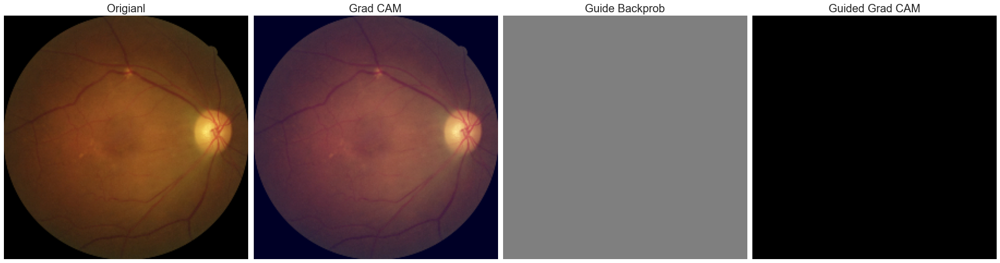

In [14]:
show_grad_cap(model, 1199)

Actual Label =  1.0
predict value =  1.0


/var/folders/6d/kfx1dpbx5bv0rv2l46dr6wmr0000gn/T/ipykernel_51874/3869694175.py:44: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  score = torch.nn.functional.mse_loss(logit, one_hot)


<Figure size 432x576 with 0 Axes>

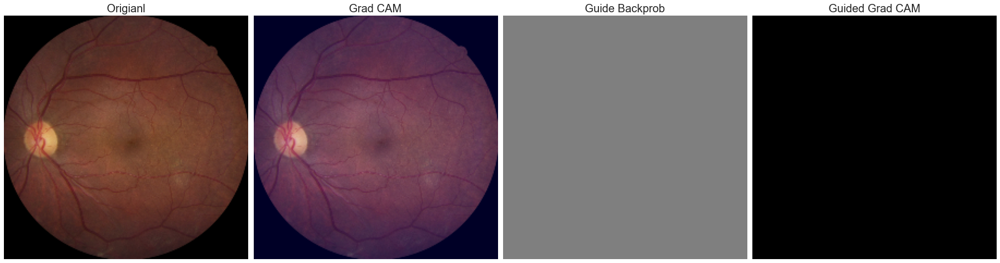

In [15]:
show_grad_cap(model, 4012)

Actual Label =  0.6000000238418579
predict value =  1.0


/var/folders/6d/kfx1dpbx5bv0rv2l46dr6wmr0000gn/T/ipykernel_51874/3869694175.py:44: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  score = torch.nn.functional.mse_loss(logit, one_hot)


<Figure size 432x576 with 0 Axes>

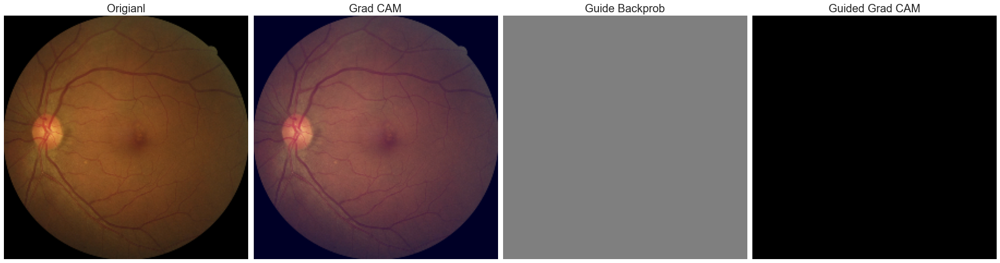

Actual Label =  0.0
predict value =  1.0


<Figure size 432x576 with 0 Axes>

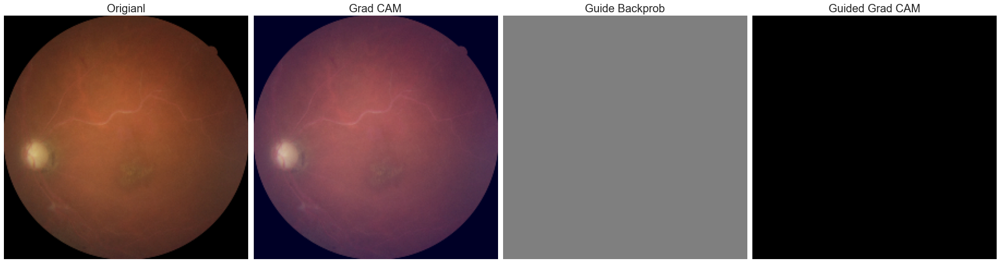

Actual Label =  0.8999999761581421
predict value =  1.0


<Figure size 432x576 with 0 Axes>

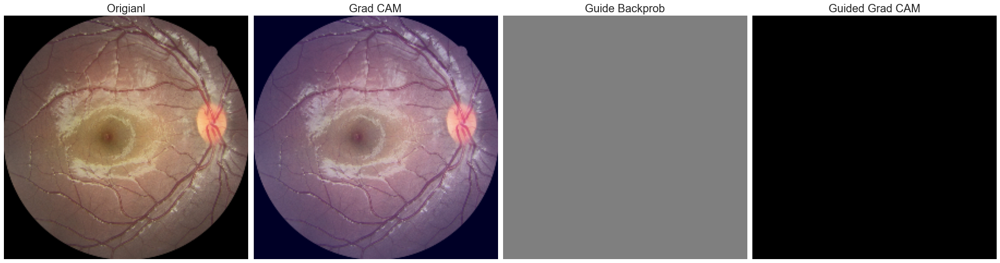

Actual Label =  1.0
predict value =  0.00019754463573917747


<Figure size 432x576 with 0 Axes>

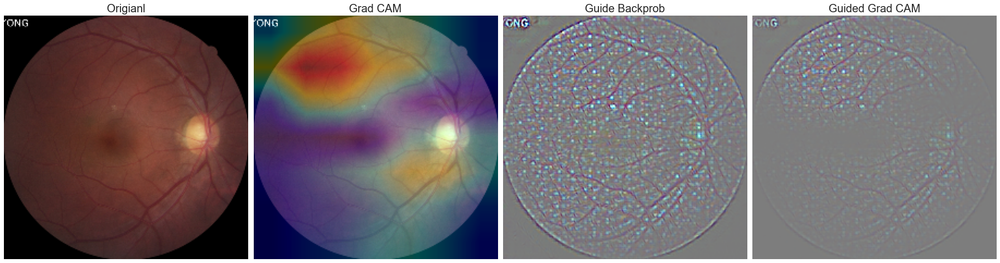

Actual Label =  1.0
predict value =  0.9999898672103882


<Figure size 432x576 with 0 Axes>

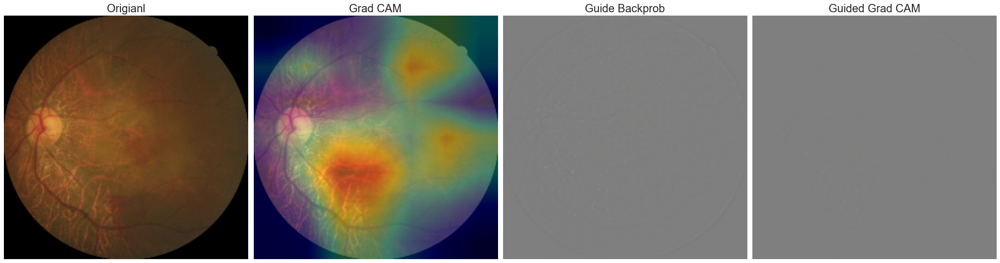

Actual Label =  0.800000011920929
predict value =  1.0


<Figure size 432x576 with 0 Axes>

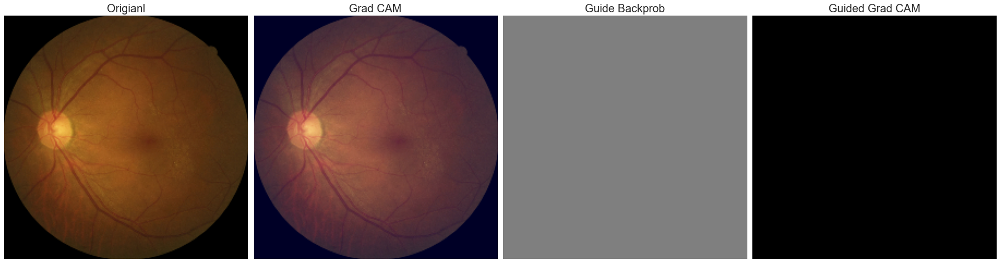

Actual Label =  1.0
predict value =  1.0


<Figure size 432x576 with 0 Axes>

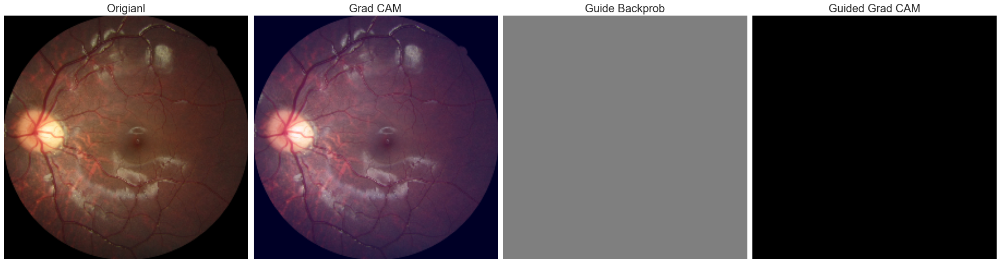

Actual Label =  0.699999988079071
predict value =  1.0


<Figure size 432x576 with 0 Axes>

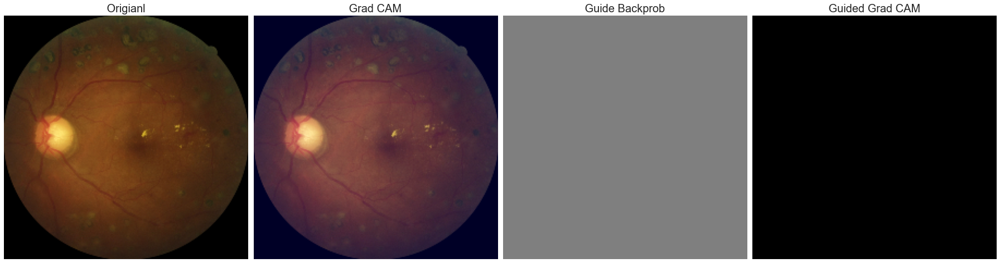

Actual Label =  0.699999988079071
predict value =  0.9985100626945496


<Figure size 432x576 with 0 Axes>

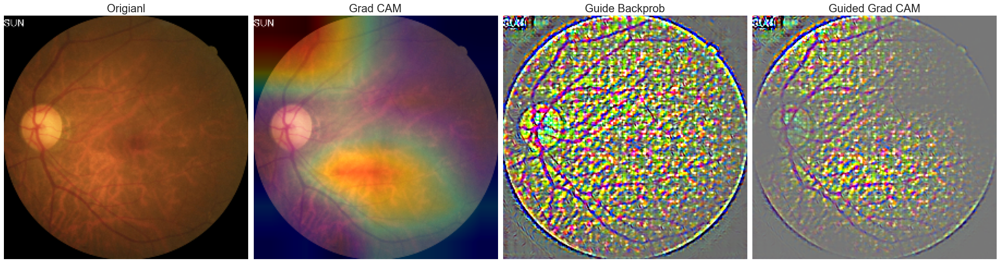

Actual Label =  0.0
predict value =  3.0608551988570848e-15


<Figure size 432x576 with 0 Axes>

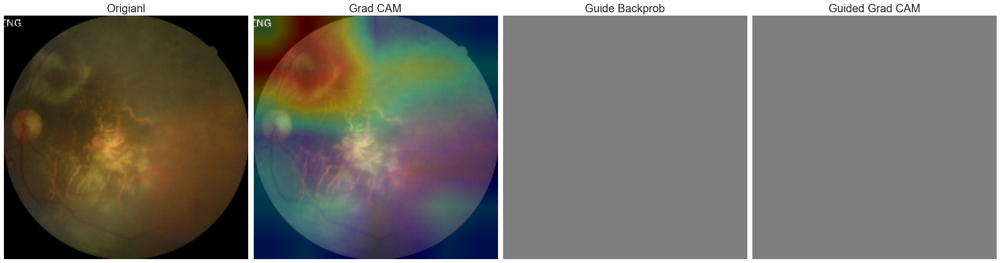

Actual Label =  1.0
predict value =  1.0


<Figure size 432x576 with 0 Axes>

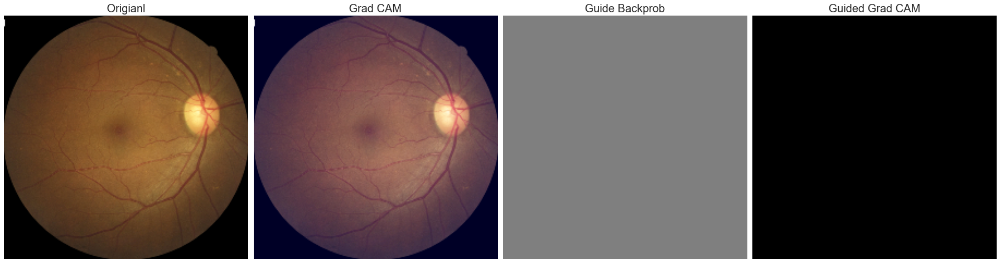

Actual Label =  0.20000000298023224
predict value =  0.0


<Figure size 432x576 with 0 Axes>

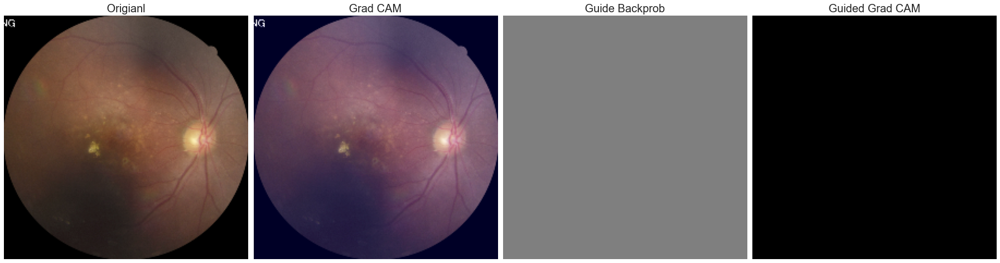

Actual Label =  0.6000000238418579
predict value =  1.0


<Figure size 432x576 with 0 Axes>

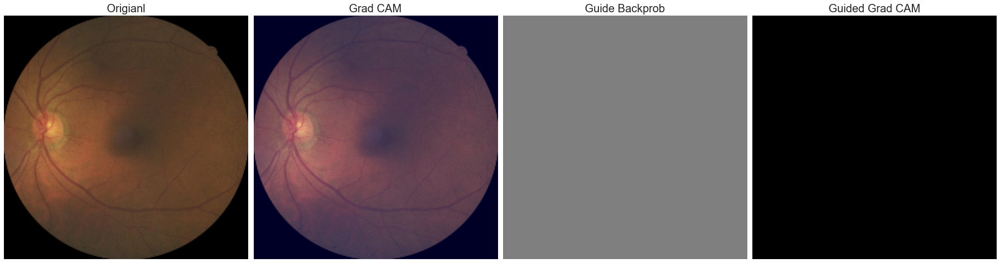

Actual Label =  0.8999999761581421
predict value =  1.0


<Figure size 432x576 with 0 Axes>

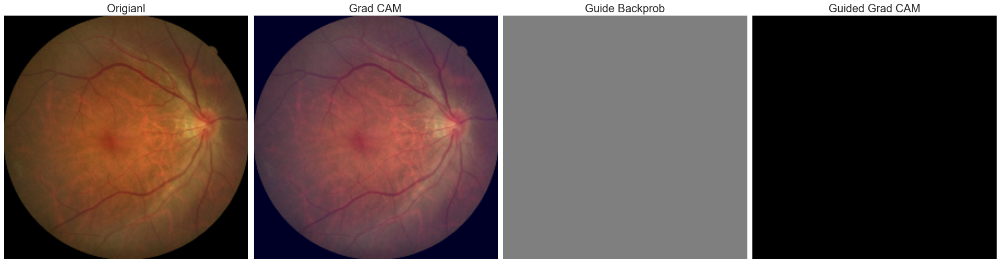

Actual Label =  1.0
predict value =  1.1170693669446864e-18


<Figure size 432x576 with 0 Axes>

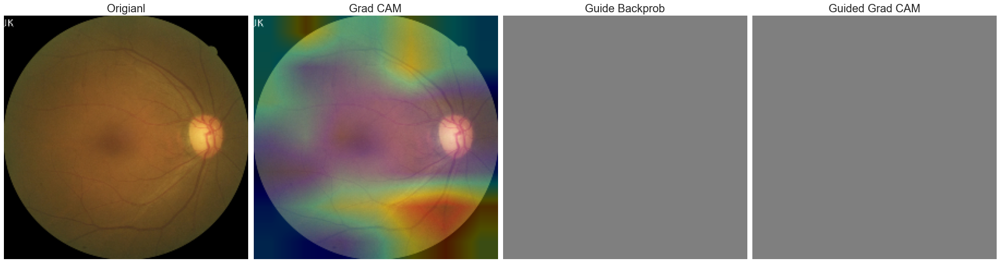

Actual Label =  1.0
predict value =  1.0


<Figure size 432x576 with 0 Axes>

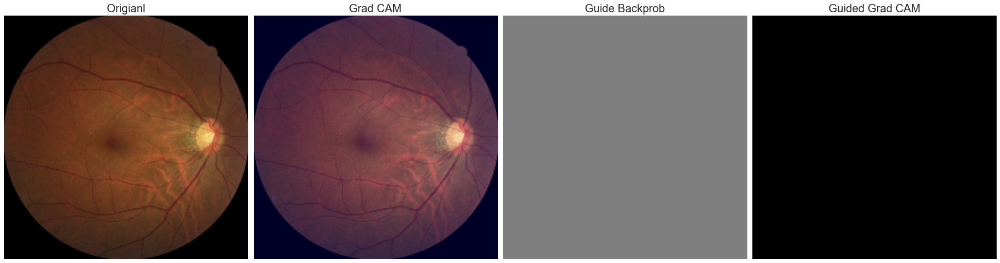

Actual Label =  0.5
predict value =  1.7721216204538703e-12


<Figure size 432x576 with 0 Axes>

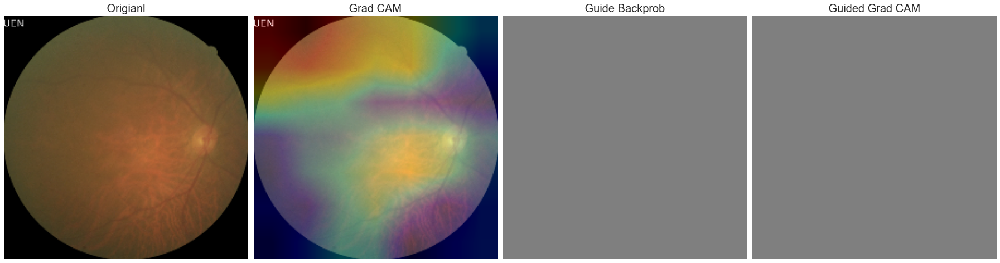

Actual Label =  1.0
predict value =  7.070858032420801e-08


<Figure size 432x576 with 0 Axes>

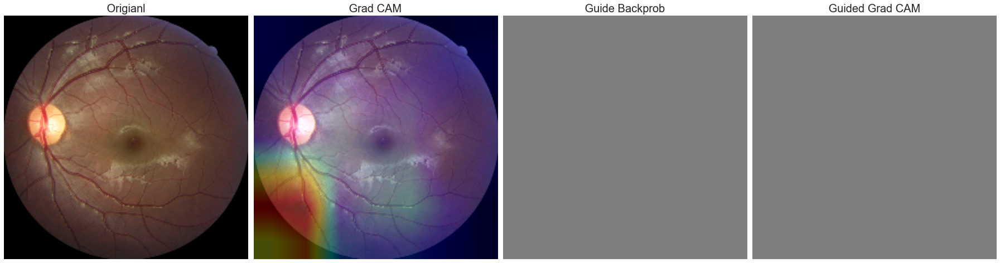

Actual Label =  1.0
predict value =  1.0


<Figure size 432x576 with 0 Axes>

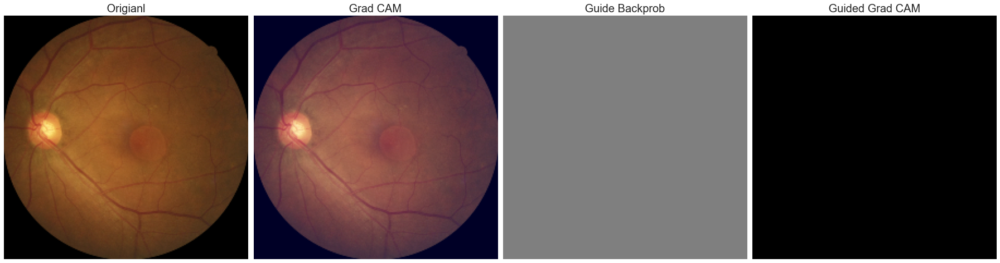

Actual Label =  0.6000000238418579
predict value =  0.9946309328079224


<Figure size 432x576 with 0 Axes>

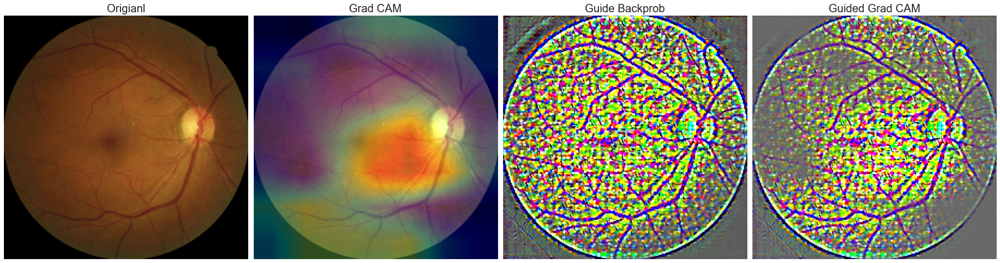

In [16]:
for i in range(20):
    idx = np.random.randint(5000)
    show_grad_cap(model, idx)